<a href="https://colab.research.google.com/github/Muskan2320/CVIP-Data-Science/blob/main/Exploratory_Data_Analysis_Terrorism.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploratory Data Analysis

It is performed on the dataset of Global terrorism. It has many features but in this lab file I have selected a few which include:


1. Year: It is the year in which attack happened
2. Month: It is the month in which attack happened
3. Day: It is the day on which attack happened
4. Country: Thecountry in which attack happened
5. Region: The region like Asia, Africa, etc. where attack happened
6. Latitude: Lattitude of the location of attack
7. Longitude: Longitude of the location of attack
8. Success: This tells whether the attack was successful or not
9. Attack_type: It refers to the type of terrorist attack like Hijack, Bombing, etc.
10. Target_type: Organization, public or private place that is attacked
11. Gang_name: Name of the Gang that attacked
12. Weapon_type: Weapon used for attacking
13. Number_killed: It refers the number of people killed

Data source: Kaggle (https://www.kaggle.com/datasets/START-UMD/gtd)

Warning library is used to control the warnings of the commands executed. Warning messages are typically issued in situations where it is useful to alert the user of some condition in a program, where that condition (normally) doesn’t warrant raising an exception and terminating the program.

In [1]:
import warnings
warnings.filterwarnings('ignore')                         # This removes all the warnings from the output

In [2]:
# The 'Pandas' package is a fast, flexible tool used to analyze data. It helps in reading and updating the files like csv files, excel, etc.
import pandas as pd

# NumPy is used to deal with matrix
import numpy as np

# The 'matplotlib' is a visualization package. It is used for creating static, animated, and interactive visualizations.
import matplotlib.pyplot as plt

# Seaborn is a visualization library based on the matplotlib. Seaborn is the superset of matplotlib. It can be used for drawing attractive and informative statistical graphics.
import seaborn as sns

In [3]:
# Connecting the colab with google drive

from google.colab import drive
drive.mount('/content/drive/')

!unzip /content/drive/MyDrive/global_terrorism.csv.zip

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
Archive:  /content/drive/MyDrive/global_terrorism.csv.zip
  inflating: globalterrorismdb_0718dist.csv  


# Data Read

In [4]:
data = pd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')     # read a comma separated file(csv), encoding used to encode data to text
data.head()                                                                     # Get the first five rows of dataset

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [5]:
print(data.columns)                                                             # Get columns of dataset

# Selecting the required columns
data = data[['iyear', 'imonth', 'iday', 'country_txt', 'region_txt', 'latitude',
       'longitude', 'success', 'attacktype1_txt', 'targtype1_txt', 'gname', 'weaptype1_txt', 'nkill']]

data.head()

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)


,iyear,imonth,iday,country_txt,region_txt,latitude,longitude,success,attacktype1_txt,targtype1_txt,gname,weaptype1_txt,nkill
0,1970,7,2,Dominican Republic,Central America & Caribbean,18.456792,-69.951164,1,Assassination,Private Citizens & Property,MANO-D,Unknown,1.0
1,1970,0,0,Mexico,North America,19.371887,-99.086624,1,Hostage Taking (Kidnapping),Government (Diplomatic),23rd of September Communist League,Unknown,0.0
2,1970,1,0,Philippines,Southeast Asia,15.478598,120.599741,1,Assassination,Journalists & Media,Unknown,Unknown,1.0
3,1970,1,0,Greece,Western Europe,37.997490,23.762728,1,Bombing/Explosion,Government (Diplomatic),Unknown,Explosives,NaN
4,1970,1,0,Japan,East Asia,33.580412,130.396361,1,Facility/Infrastructure Attack,Government (Diplomatic),Unknown,Incendiary,NaN


In [6]:
# Renamin the columns
data.rename(columns={'iyear':'Year', 'imonth':'Month', 'iday':'Day', 'country_txt':'Country', 'region_txt':'Region',
                     'longitude':'Longitude', 'latitude':'Latitude', 'success':'Success', 'attacktype1_txt':'Attack_type',
                     'targtype1_txt':'Target_type', 'gname':'Gang_name', 'weaptype1_txt':'Weapon_type', 'nkill':'Number_killed'}, inplace=True)

print(data.columns)

Index(['Year', 'Month', 'Day', 'Country', 'Region', 'Latitude', 'Longitude',
       'Success', 'Attack_type', 'Target_type', 'Gang_name', 'Weapon_type',
       'Number_killed'],
      dtype='object')


In [7]:
data.shape                                                                      # Returns the shape of data

(181691, 13)

# Data Cleaning

In [8]:
data.info()                                                                     # Get the summary/information of the dataframe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 13 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Year           181691 non-null  int64  
 1   Month          181691 non-null  int64  
 2   Day            181691 non-null  int64  
 3   Country        181691 non-null  object 
 4   Region         181691 non-null  object 
 5   Latitude       177135 non-null  float64
 6   Longitude      177134 non-null  float64
 7   Success        181691 non-null  int64  
 8   Attack_type    181691 non-null  object 
 9   Target_type    181691 non-null  object 
 10  Gang_name      181691 non-null  object 
 11  Weapon_type    181691 non-null  object 
 12  Number_killed  171378 non-null  float64
dtypes: float64(3), int64(4), object(6)
memory usage: 18.0+ MB


In [9]:
data.isnull().sum()                                                             # count the number of rows with null values in each column

Year                 0
Month                0
Day                  0
Country              0
Region               0
Latitude          4556
Longitude         4557
Success              0
Attack_type          0
Target_type          0
Gang_name            0
Weapon_type          0
Number_killed    10313
dtype: int64

In [10]:
data['Number_killed'].fillna(0, inplace=True)                                   # Filling NaN values with zero

data['Number_killed'].isnull().sum()

0

# Exploratory Data Analysis

## Yearly Trends

In [11]:
# size() function returns the number of attacks in each year(or number of times each year appeared in dataset)
# reset_index() used to reset the index on the basis of count
# specifying the parameter name gives the desired name to the new created column(here it is 'count')
yearly_attack = data.groupby('Year').size().reset_index(name = 'count')         # groupby() function groups the rows with same year as one and hence, count the number

yearly_attack

,Year,count
0,1970,651
1,1971,471
2,1972,568
3,1973,473
4,1974,581
5,1975,740
6,1976,923
7,1977,1319
8,1978,1526
9,1979,2662


Maximum Attacks:
    Year  count
43  2014  16903


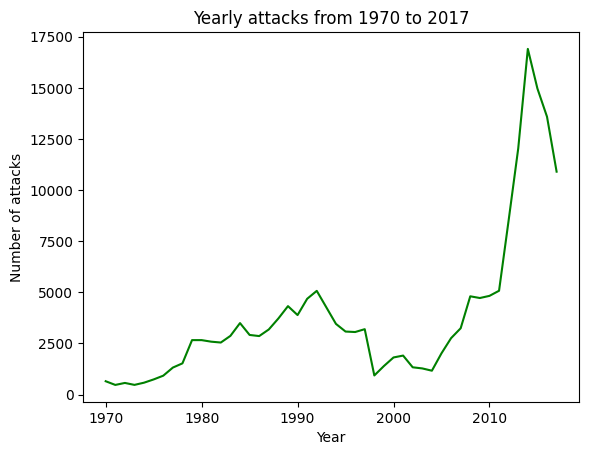

In [12]:
# Lineplot is used to show trends over a period of time

sns.lineplot(x = 'Year', y = 'count', data = yearly_attack, color = 'green')
plt.xlabel("Year")                                                              # Lebel the x-axis
plt.ylabel("Number of attacks")                                                 # Label the y-axis
plt.title("Yearly attacks from 1970 to 2017")                                   # Gives title to the graph
print("Maximum Attacks:")
print(yearly_attack[yearly_attack['count']==max(yearly_attack['count'])])       # printsyear with maximum attacks

## Most attacked countries

In [13]:
yearly_country_attacks = data.groupby(['Year', 'Country']).size().reset_index(name='count')

In [14]:
country  = data.groupby(['Country']).size().reset_index(name='count').sort_values(by='count')   # sort_values() function sorts the data on the basis of count column
country_10 = list(country['Country'][-10:].values)                                              # Get top 10 most attacked countries

country_10

['Turkey',
 'United Kingdom',
 'El Salvador',
 'Peru',
 'Philippines',
 'Colombia',
 'India',
 'Afghanistan',
 'Pakistan',
 'Iraq']

Text(0.5, 1.0, 'Yearly attacks in different countries from 1970 to 2017')

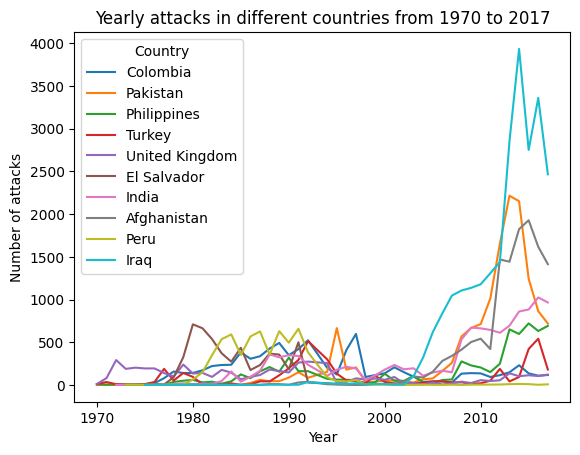

In [15]:
# Collecting data of only top 10 attacked countries. isin() function checks whether given country is there in top 10 countries or not
yearly_country_attacks = yearly_country_attacks[yearly_country_attacks['Country'].isin(country_10)]

sns.lineplot(x = 'Year', y = 'count', hue = 'Country', data = yearly_country_attacks)
plt.xlabel("Year")
plt.ylabel("Number of attacks")
plt.title("Yearly attacks in different countries from 1970 to 2017")

Text(0.5, 1.0, 'Top 10 most atttacked countries')

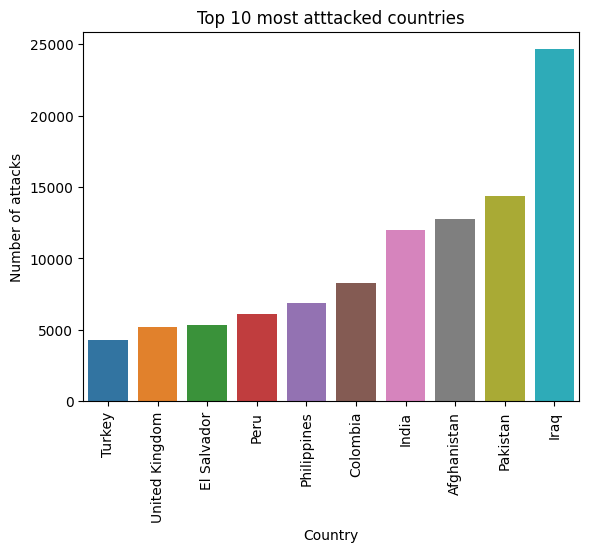

In [16]:
country_data = country[-10:]

# Bar plot is plotted for categorical value. It plots the different categories of any feature.
sns.barplot(x='Country', y='count', data=country_data)
plt.xlabel("Country")
plt.xticks(rotation=90)                                                         # rotation rotates the xticks by 90 degree
plt.ylabel("Number of attacks")
plt.title("Top 10 most atttacked countries")

## Countries and Regions attacked in 2014

In [17]:
data_14 = data[data['Year'] == 2014]

Text(0.5, 1.0, 'Most attacked countries in 2014')

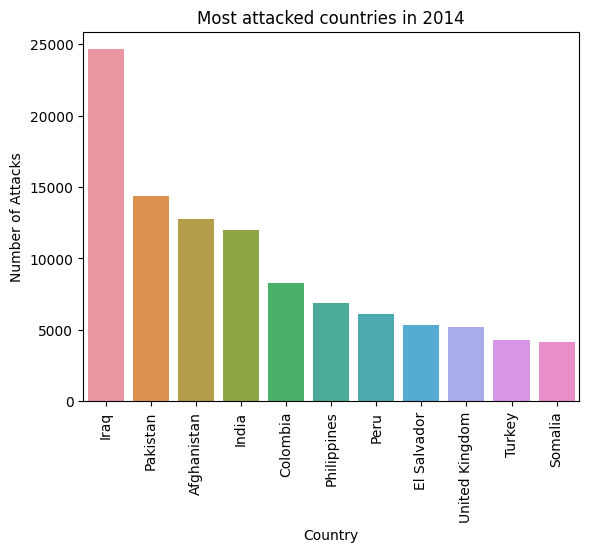

In [18]:
con_14 = data.groupby(['Country']).size().reset_index(name='count').sort_values(by='count', ascending = False)
con_14 = con_14[:11]

sns.barplot(x='Country', y='count', data=con_14)
plt.xlabel('Country')
plt.xticks(rotation=90)
plt.ylabel('Number of Attacks')
plt.title('Most attacked countries in 2014')

Text(0.5, 1.0, 'Most attacked regions in 2014')

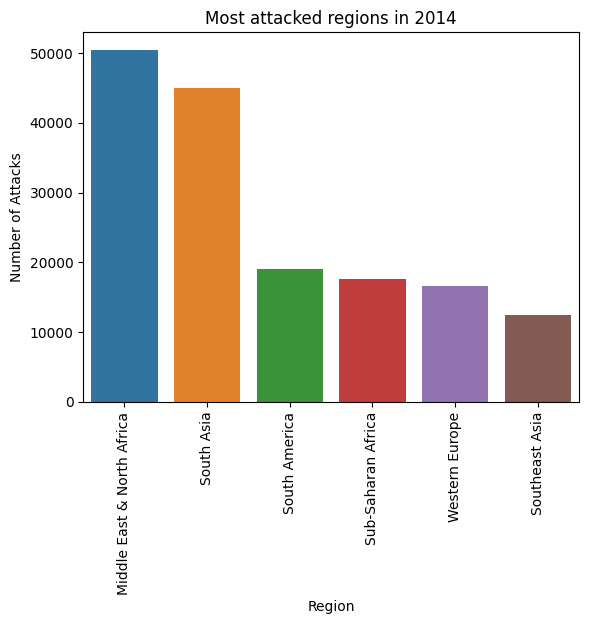

In [19]:
reg_14 = data.groupby(['Region']).size().reset_index(name='count').sort_values(by='count', ascending = False)
reg_14 = reg_14[:6]

sns.barplot(x='Region', y='count', data=reg_14)
plt.xlabel('Region')
plt.xticks(rotation=90)
plt.ylabel('Number of Attacks')
plt.title('Most attacked regions in 2014')

## Successful and unsuccessful attacks

Percentage of success:  88.95982739926579


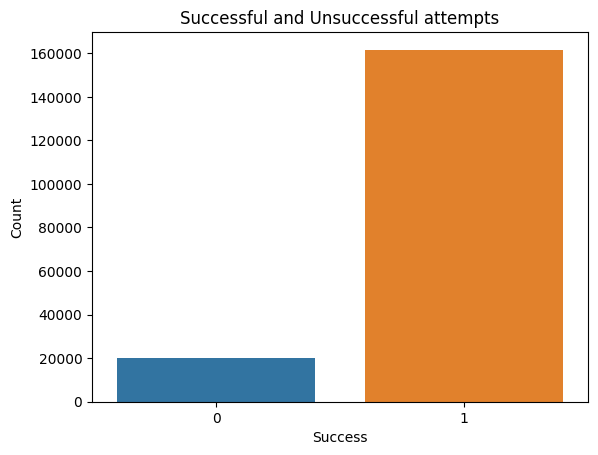

In [20]:
succ_data = data.groupby(['Success']).size().reset_index(name='count')

sns.barplot(x='Success', y='count', data=succ_data)
plt.xlabel('Success')
plt.ylabel('Count')
plt.title("Successful and Unsuccessful attempts")
print("Percentage of success: ", succ_data['count'][1]/(succ_data['count'][0] + succ_data['count'][1])*100)

## Successful attacks in India

Percentage of success:  85.95317725752508


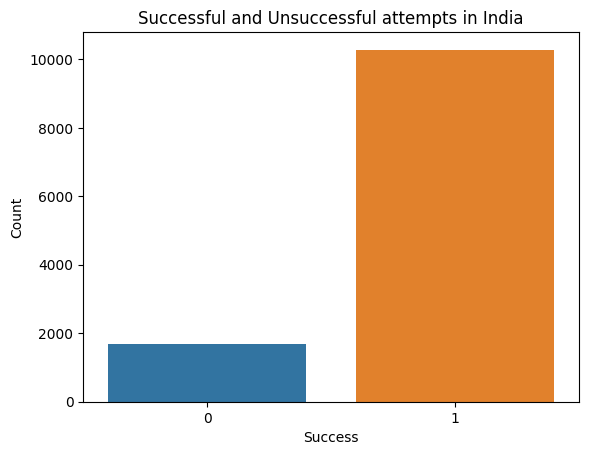

In [21]:
in_data = data[data['Country'] == 'India']
in_data = in_data.groupby(['Success']).size().reset_index(name='count')

sns.barplot(x='Success', y='count', data=in_data)
plt.xlabel('Success')
plt.ylabel('Count')
plt.title("Successful and Unsuccessful attempts in India")
print("Percentage of success: ", in_data['count'][1]/(in_data['count'][0] + in_data['count'][1])*100)

## People killed in India

Text(0.5, 1.0, 'Person killed in India')

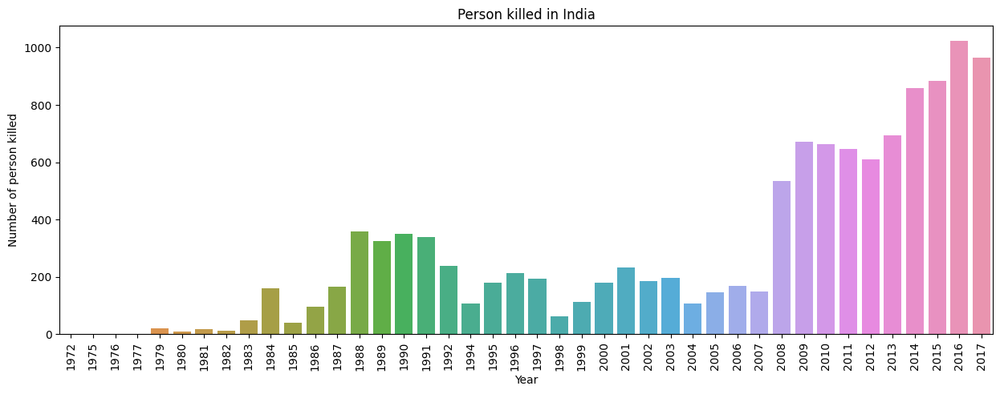

In [22]:
killed = data[data['Country'] == 'India']
killed = killed[['Year', 'Number_killed']]
killed = killed.groupby(['Year']).size().reset_index(name='count')

plt.figure(figsize=(15, 5))
sns.barplot(x='Year', y='count', data=killed)
plt.xlabel('Year')
plt.xticks(rotation=90)
plt.ylabel('Number of person killed')
plt.title("Person killed in India")

## Attacks with major life loss

In [23]:
attack = data.sort_values(by='Number_killed', ascending = False)[:60]           # attribute ascending(by default True) = False implies data is to sorted in descending order.

# Pivot table is a statistical table that summarizes a substantial table like big datasets. This summary in pivot tables may include mean, median, sum, or other statistical terms.
attack = attack.pivot_table(index='Country', columns='Year', values='Number_killed')
attack.fillna(0, inplace=True)
attack.head()

Year,1978,1980,1983,1984,1985,1986,1987,1988,1994,1996,...,2001,2004,2006,2007,2009,2012,2014,2015,2016,2017
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,240.0,0.0,266.0
Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,259.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Burundi,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,339.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Canada,0.0,0.0,0.0,0.0,329.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<Axes: xlabel='Year', ylabel='Country'>

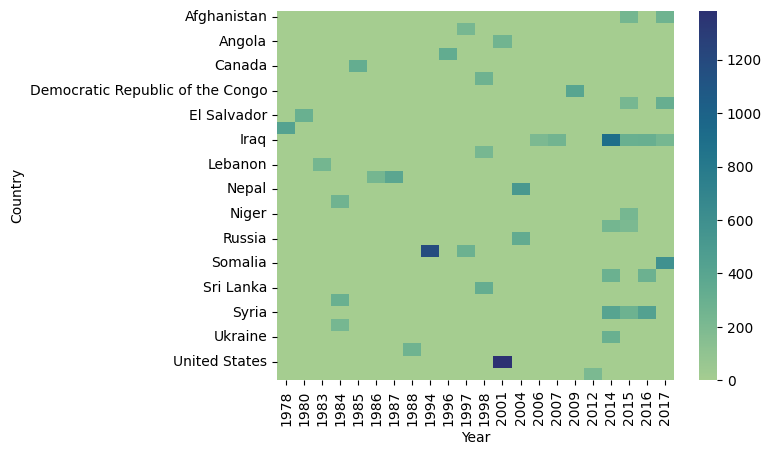

In [24]:
# Heatmap is graphical representation of data using colors to visualize the value of the matrix. Higher or common values are darker than others

sns.heatmap(attack, cmap='crest')

## Types of attack occur

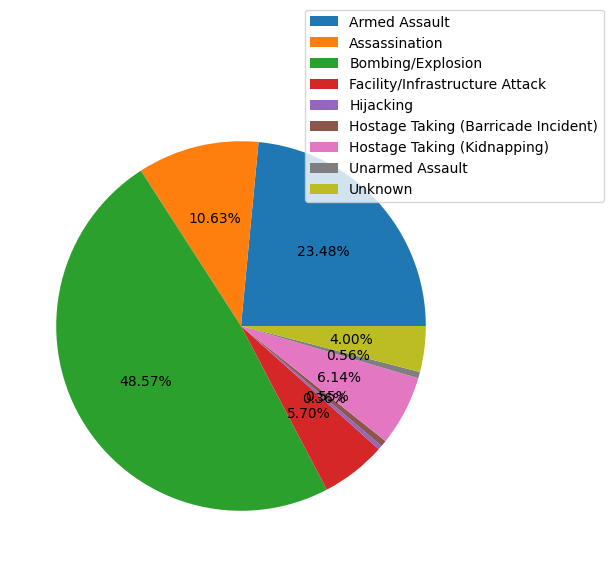

In [25]:
attk = data.groupby(['Attack_type']).size().reset_index(name='count')

plt.figure(figsize=(6, 6))                                                      # Adjusting the figure size
# A Pie Chart is a circular statistical plot that can display only one series of data. The area of the chart is the total percentage of the given data.
# autopct attribute refers to adjusting the float point value of auto percentage
plt.pie(attk['count'], autopct='%.2f%%')
# loc attribute refers to the location of legend
# bbox_to_anchor attribute refers to the exact position of legend
plt.legend(labels=attk['Attack_type'], loc = 'upper right', bbox_to_anchor = (1.3,1.2))
plt.show()                                                                      # Displays the graph

## Most dangerous Gangs

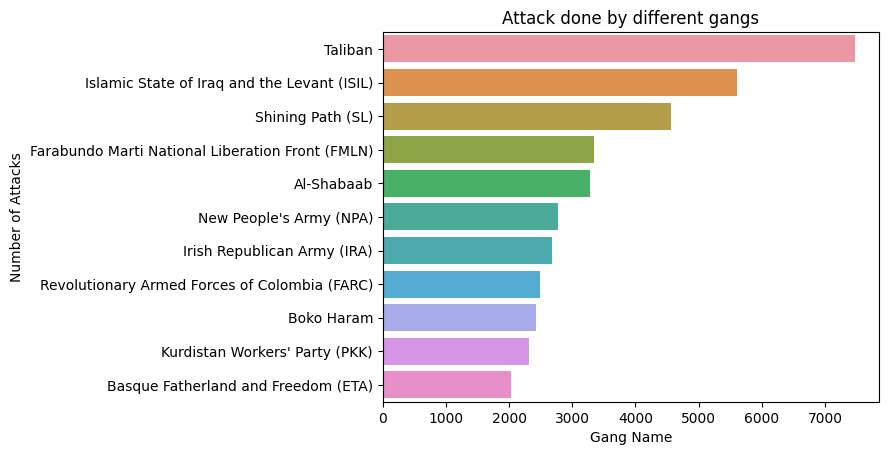

In [26]:
# Excluding the unknown attacks
gang = data.groupby(['Gang_name']).size().reset_index(name='count').sort_values(by='count', ascending=False)[1:12]

sns.barplot(y='Gang_name', x='count', data=gang)
plt.xlabel('Gang Name')
plt.ylabel('Number of Attacks')
plt.title('Attack done by different gangs')
plt.show()

## Ways of attacking of Taliban Gang

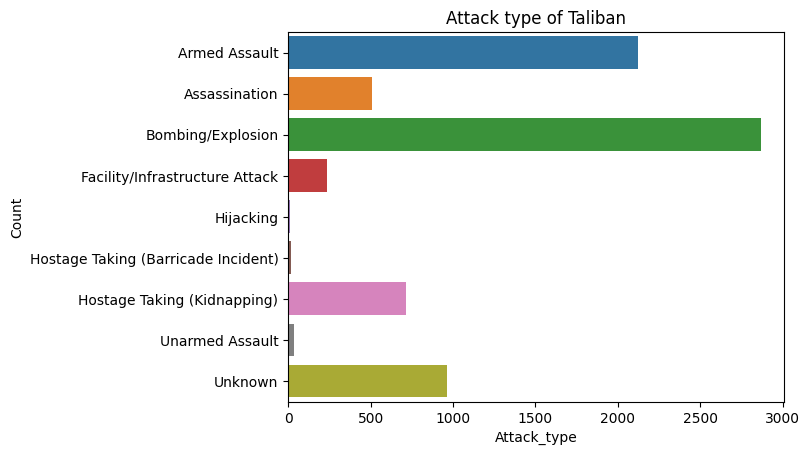

In [27]:
tali = data[data['Gang_name'] == 'Taliban']
tali = tali.groupby(['Attack_type']).size().reset_index(name='count')

sns.barplot(y='Attack_type', x='count', data=tali)
plt.xlabel('Attack_type')
plt.ylabel('Count')
plt.title("Attack type of Taliban")
plt.show()

## Most attacked targets

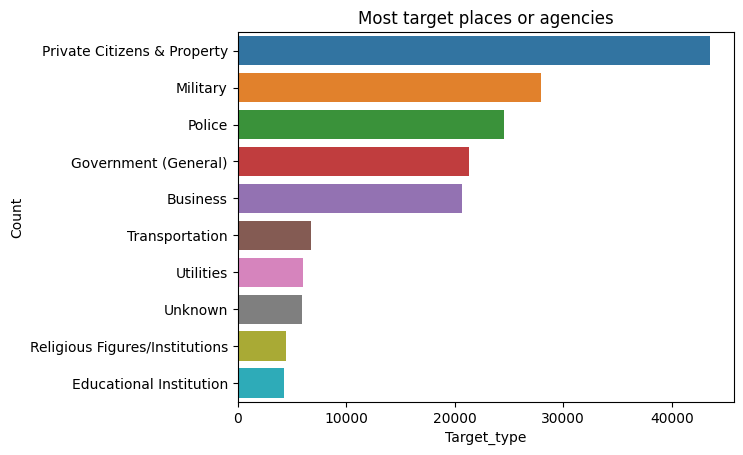

In [28]:
trgt = data.groupby(['Target_type']).size().reset_index(name='count').sort_values(by='count', ascending=False)[:10]

sns.barplot(y='Target_type', x='count', data=trgt)
plt.xlabel('Target_type')
plt.ylabel('Count')
plt.title("Most target places or agencies")
plt.show()

## Attacks of year 2014 and their locations

In [29]:
# Folium is a Python library used for visualizing geospatial data. It makes it easy to visualize data on an interactive leaflet map
import folium
# MarkCluster used to create clusters of markers
from folium.plugins import MarkerCluster

yr17 = data[data['Year'] == 2014]
yr17 = yr17[['Country', 'Latitude', 'Longitude']]
yr17 = yr17.dropna()                                                            # Drop NaN values
yr17_list = yr17.values.tolist()                                                # Converts data to a 2D list

In [32]:
map = folium.Map(location = [0, 30], tiles = 'CartoDB positron', zoom_start=2)  # A map is created with zoom of 2 at (0,30) location, CartoDB positron describes the type of map
marker = folium.plugins.MarkerCluster().add_to(map)                             # Create marker cluster, these clusters are added to map

for point in range(len(yr17_list)):
  # Marker is pointed to the specified location(latitude, longitude)
  # popup attribute defines the name or text to be displayed when clicked on marker
  folium.Marker(location=[yr17_list[point][1], yr17_list[point][2]], popup = yr17_list[point][0]).add_to(marker) # Marker added to cluster

map